**Swin Factorizer, FedProx, ISLES'24**

In [1]:
#!pip install monai nibabel torch torchvision torchmetrics -q

In [2]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from monai.transforms import LoadImaged, EnsureChannelFirstd, Compose, ResizeWithPadOrCropd, NormalizeIntensityd, Orientationd, Spacingd, CropForegroundd, RandCropByPosNegLabeld
from monai.networks.nets import SegResNet
from monai.losses import DiceLoss
from monai.metrics import DiceMetric, HausdorffDistanceMetric
from monai.data import list_data_collate
from monai.inferers import SlidingWindowInferer

from glob import glob
import copy
#from google.colab import drive

import random
import nibabel as nib
import numpy as np

from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
from tqdm import tqdm
import warnings
import shutil

In [3]:
#supress warnings for cleaner console output
warnings.filterwarnings("ignore", category=FutureWarning, module="monai")

In [4]:
# Mount Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

data_dir = "E:/FYP/ISLES24 Split Preprocessed"
print(data_dir)

E:/FYP/ISLES24 Split Preprocessed


In [5]:
#save checkpoint and tensorboard logs in drive
checkpoint_dir = "E:/FYP/Swin Factorizer/Federated_Swin Factorizer_checkpoints"
log_dir = "E:/FYP/Swin Factorizer/Federated_Swin Factorizer_logs"

# Remove old directories if they exist
if os.path.exists(checkpoint_dir):
    shutil.rmtree(checkpoint_dir)

if os.path.exists(log_dir):
    shutil.rmtree(log_dir)

# Recreate directories
os.makedirs(checkpoint_dir)
os.makedirs(log_dir)

writer = SummaryWriter(log_dir=log_dir)
print(f"Checkpoints will be saved to: {checkpoint_dir}")
print(f"TensorBoard logs will be saved to: {log_dir}")

# %load_ext tensorboard
# %tensorboard --logdir "D:/F25-156/SegResNet/Federated_SegResNet_logs"

Checkpoints will be saved to: E:/FYP/Swin Factorizer/Federated_Swin Factorizer_checkpoints
TensorBoard logs will be saved to: E:/FYP/Swin Factorizer/Federated_Swin Factorizer_logs


In [6]:
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

In [7]:
print(torch.__version__)
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

2.5.1+cu121
CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


**MONAI Preprocessing Transforms**

In [8]:
target_shape = (128, 128, 128)

# transform = Compose([
#     LoadImaged(keys=["image", "label"]),
    
#     EnsureChannelFirstd(keys=["image", "label"]),
    
#     Orientationd(keys=["image", "label"], axcodes="RAS"),

#     Spacingd(
#         keys=["image", "label"],
#         pixdim=(1.0, 1.0, 1.0),
#         mode=("bilinear", "nearest")
#     ),

#     # ⭐ Crop based on image, applied to both
#     CropForegroundd(
#         keys=["image", "label"],
#         source_key="image",
#     ),

#     # ⭐ Make uniform shape
#     ResizeWithPadOrCropd(
#         keys=["image", "label"],
#         spatial_size=target_shape
#     ),

#     # Only normalize image
#     NormalizeIntensityd(keys=["image"], nonzero=True)
# ])

#now minimal pre processing is required
transform = Compose([
    LoadImaged(keys=["image", "label"]),
    EnsureChannelFirstd(keys=["image", "label"]),
])

**Dataset Class**

In [9]:
def load_dwi_mask_pairs(base_path):
    dwi_files = sorted(glob(os.path.join(base_path, "DWI", "*.nii*")))
    mask_files = sorted(glob(os.path.join(base_path, "masks", "*.nii*")))
    assert len(dwi_files) == len(mask_files), f"Mismatch in {base_path}"
    return dwi_files, mask_files


**Load Files and Apply MONAI Transforms**

In [10]:
class ISLESDataset(Dataset):
    def __init__(self, dwi_files, mask_files, transform=None):
        assert len(dwi_files) == len(mask_files)

        self.dwi_files = dwi_files
        self.mask_files = mask_files
        self.transform = transform

    def __len__(self):
        return len(self.dwi_files)

    def __getitem__(self, idx):
        data = {
            "image": self.dwi_files[idx],
            "label": self.mask_files[idx]
        }

        if self.transform:
            data = self.transform(data)

        image = data["image"].float()
        mask = data["label"].long()

        return {
            "image": image,
            "mask": mask
        }

**Split into “Clients” (Federated Simulation)**


Client 0
Preprocessed samples: 50

🟢 PREPROCESSED SAMPLES
Sample 40 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0])


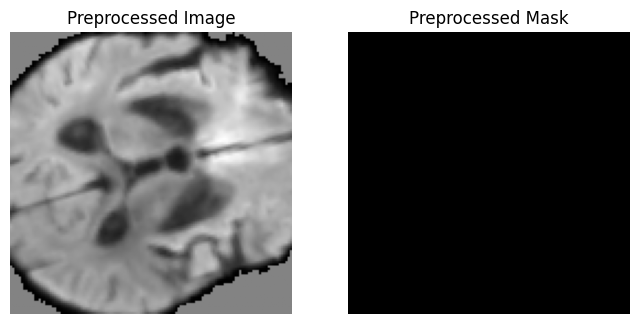

Sample 7 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0, 1])


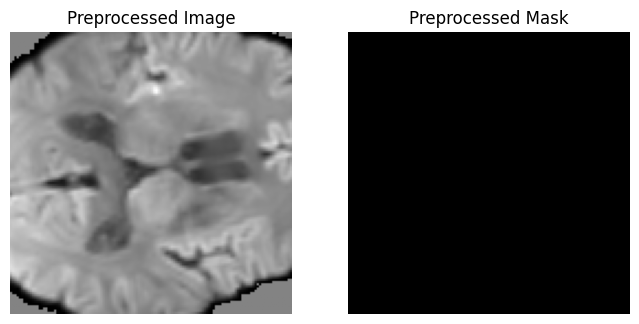


Client 0 dataset size: 50

Client 1
Preprocessed samples: 50

🟢 PREPROCESSED SAMPLES
Sample 1 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0, 1])


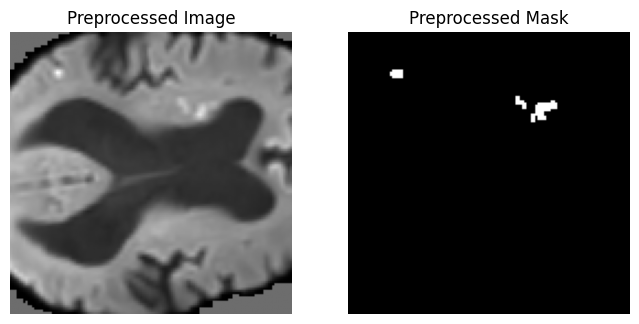

Sample 47 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0, 1])


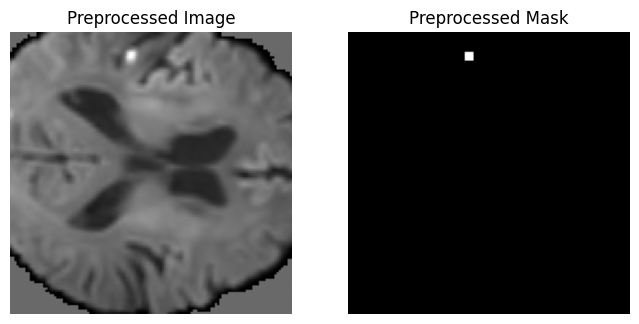


Client 1 dataset size: 50


In [11]:

original_root = "E:/FYP/ISLES24 Split"
processed_root = "E:/FYP/ISLES24 Split Preprocessed"

num_clients = 2
client_datasets = []

# -----------------------------
# Loop over clients
# -----------------------------
for i in range(num_clients):

    print("\n" + "="*60)
    print(f"Client {i}")
    print("="*60)

    # -----------------------------
    # ORIGINAL (raw split)
    # -----------------------------
    # orig_img_dir = os.path.join(original_root, "train", f"client_{i}", "DWI")
    # orig_mask_dir = os.path.join(original_root, "train", f"client_{i}", "masks")

    # dwi_files = sorted(glob(os.path.join(orig_img_dir, "*.nii*")))
    # mask_files = sorted(glob(os.path.join(orig_mask_dir, "*.nii*")))

    # -----------------------------
    # PREPROCESSED
    # -----------------------------
    proc_img_dir = os.path.join(processed_root, "train", f"client_{i}", "DWI")
    proc_mask_dir = os.path.join(processed_root, "train", f"client_{i}", "masks")

    proc_dwi = sorted(glob(os.path.join(proc_img_dir, "*.nii*")))
    proc_mask = sorted(glob(os.path.join(proc_mask_dir, "*.nii*")))

    print(f"Preprocessed samples: {len(proc_dwi)}")

    # -----------------------------
    # Pick random samples
    # -----------------------------
    sample_indices = random.sample(range(len(proc_dwi)), k=2)

    # =========================================================
    # RAW VISUALIZATION
    # =========================================================
    # print("\n🔵 RAW SAMPLES")
    # for idx in sample_indices:

    #     img = nib.load(dwi_files[idx]).get_fdata()
    #     mask = nib.load(mask_files[idx]).get_fdata()

    #     print(
    #         f"Sample {idx} | Image shape: {img.shape} | Mask shape: {mask.shape} | "
    #         f"Mask values: {torch.unique(torch.tensor(mask))}"
    #     )

    #     mid = img.shape[2] // 2

    #     plt.figure(figsize=(8,4))
    #     plt.subplot(1,2,1)
    #     plt.imshow(img[:,:,mid], cmap="gray")
    #     plt.title("Raw Image")
    #     plt.axis("off")

    #     plt.subplot(1,2,2)
    #     plt.imshow(mask[:,:,mid], cmap="gray")
    #     plt.title("Raw Mask")
    #     plt.axis("off")
    #     plt.show()

    # =========================================================
    # PREPROCESSED VISUALIZATION
    # =========================================================
    print("\n🟢 PREPROCESSED SAMPLES")

    # dataset uses ONLY minimal transform
    ds = ISLESDataset(
        dwi_files=proc_dwi,
        mask_files=proc_mask,
        transform=transform,
    )

    client_datasets.append(ds)

    for idx in sample_indices:

        sample = ds[idx]

        img_proc = sample["image"][0].numpy()
        mask_proc = sample["mask"][0].numpy()

        print(
            f"Sample {idx} | Image shape: {img_proc.shape} | "
            f"Mask shape: {mask_proc.shape} | Mask values: {torch.unique(sample['mask'])}"
        )

        mid = img_proc.shape[2] // 2

        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img_proc[:,:,mid], cmap="gray")
        plt.title("Preprocessed Image")
        plt.axis("off")

        plt.subplot(1,2,2)
        plt.imshow(mask_proc[:,:,mid], cmap="gray")
        plt.title("Preprocessed Mask")
        plt.axis("off")
        plt.show()

    print(f"\nClient {i} dataset size: {len(ds)}")

**Validation Set**

In [12]:
val_dwi, val_masks = load_dwi_mask_pairs(os.path.join(data_dir, "val"))

val_dataset = ISLESDataset(
    dwi_files=val_dwi,
    mask_files=val_masks,
    transform=transform,
)

val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

print("Validation samples:", len(val_dataset))

Validation samples: 20


In [13]:
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


In [14]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda:0


## Swin Factorizer

In [15]:
!pip install git+https://github.com/pashtari/factorizer.git

  Cloning https://github.com/pashtari/factorizer.git to C:\Users\FAST.LAB12-PC45.001\AppData\Local\Temp\pip-req-build-0zgdkrp_
  Resolved https://github.com/pashtari/factorizer.git to commit 9adcc5d3c5178d458f5720125ce450e7696f1e09
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
   ---------------------------------------- 0.0/9.9 MB ? eta -:--:--
   -------------------------- ------------- 6.6/9.9 MB 40.3 MB/s eta 0:00:01
   ---------------------------------------- 9.9/9.9 MB 38.5 MB/s  0:00:00
  Created wheel for factorizer: filename=factorizer-0.0.2-py3-none-any.whl size=28712 sha256=b6c74b66af630d771fcf382723228a09a8a804ab346e4dc8a406f273f6b5d726
  Stored in directory: C:\Users\FAST.LAB12-PC45.001\AppData\

  Running command git clone --filter=blob:none --quiet https://github.com/pashtari/factorizer.git 'C:\Users\FAST.LAB12-PC45.001\AppData\Local\Temp\pip-req-build-0zgdkrp_'

[notice] A new release of pip is available: 26.0.1 -> 26.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [16]:
import factorizer as ft

In [17]:
def create_model():
    model = ft.Factorizer(
        in_channels=1,
        out_channels=1,
        spatial_size=target_shape,
        encoder_depth=(1, 1, 1, 1),
        encoder_width=(32, 64, 128, 256),
        strides=(1, 2, 2, 2, 2),
        decoder_depth=(1, 1, 1, 1),
        norm=ft.LayerNorm,
        reshape=(ft.SWMatricize, {'head_dim': 8, 'patch_size': 2}),
        act=nn.ReLU,
        factorize=ft.NMF, 
        rank=1,
        num_iters=3,
        init="uniform",
        solver="hals",
        mlp_ratio=2,
        dropout=0.1
    ).to(device)
    print(model)
    return model

**Client Class**

In [18]:
class Client:
    def __init__(self, client_id, dataset, device, mu=0.01):
        self.id = client_id
        self.loader = DataLoader(dataset, batch_size=1, shuffle=True, collate_fn=list_data_collate)
        self.device = device
        self.model = create_model().to(device)
        self.optimizer = optim.Adam(self.model.parameters(), lr=1e-4)
        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.mu = mu   # FedProx coefficient
    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + 0.3*self.bce_loss(y_pred, y_true)

    def get_parameters(self):
        return {k: v.cpu().clone() for k, v in self.model.state_dict().items()}

    def set_parameters(self, parameters):
        self.model.load_state_dict(parameters)


    def train_epochs(self, num_epochs=1):
        self.model.train()
        total_loss = 0

        # store global parameters
        global_params = [param.clone().detach() for param in self.model.parameters()]
        
        # Progress bar for epochs
        for epoch in tqdm(range(1, num_epochs + 1), desc=f"Client {self.id} Epochs", leave=True):
            epoch_loss = 0

            for batch in self.loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                self.optimizer.zero_grad()
                outputs = self.model(images)
                loss = self.loss_fn(outputs, masks)

                # FedProx proximal term 
                prox_term = 0.0
                for param, global_param in zip(self.model.parameters(), global_params):
                    prox_term += torch.norm(param - global_param) ** 2

                loss = loss + (self.mu / 2) * prox_term

                loss.backward()
                self.optimizer.step()

                total_loss += loss.item()
                epoch_loss += loss.item()

                # Metrics for monitoring
                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

            # Compute metrics at the end of the epoch
            mean_dice = self.dice_metric.aggregate().item()
            # mean_hd95 = self.hd_metric.aggregate().item()
            try:
                mean_hd95 = self.hd_metric.aggregate().item()
            except ValueError:
                mean_hd95 = float('nan')  # or 0
            mean_iou = mean_dice / (2 - mean_dice)

            # Print per-epoch metrics
            print(f"Client {self.id} | Epoch {epoch}/{num_epochs} | "
                  f"Loss: {epoch_loss/len(self.loader):.4f} | Dice: {mean_dice:.4f} | "
                  f"IoU: {mean_iou:.4f} | HD95: {mean_hd95:.4f}")

            # Reset metrics for next epoch
            self.dice_metric.reset()
            self.hd_metric.reset()

        # Average loss across all epochs
        avg_loss = total_loss / (len(self.loader) * num_epochs)

        # Return last epoch metrics
        return avg_loss, mean_dice, mean_iou, mean_hd95

**Server Class**

In [19]:
class Server:
    def __init__(self, val_loader, device):
        self.device = device
        self.global_model = create_model().to(device)
        self.val_loader = val_loader

        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.best_dice = 0.0

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + \
               0.3*self.bce_loss(y_pred, y_true)

    def aggregate(self, client_params_list):
        new_params = {}

        for key in client_params_list[0].keys():
            param = client_params_list[0][key]

            # Only average floating point tensors
            if torch.is_floating_point(param):
                new_params[key] = param.clone()

                for i in range(1, len(client_params_list)):
                    # prevent device inconsistency- if client tensors are on different devices (CPU vs GPU), this can crash:
                    new_params[key] += client_params_list[i][key].to(param.device)

                new_params[key] /= len(client_params_list)

            else:
                # Copy non-float params (int, bool, etc.) directly
                new_params[key] = param.clone()

        self.global_model.load_state_dict(new_params)
    def distribute(self, clients):
        global_params = self.global_model.state_dict()
        for client in clients:
            client.set_parameters(global_params)

    def validate(self):
        self.global_model.eval()
        val_loss = 0

        with torch.no_grad():
            for batch in self.val_loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                outputs = self.global_model(images)
                loss = self.loss_fn(outputs, masks)
                val_loss += loss.item()

                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

        avg_loss = val_loss / len(self.val_loader)
        mean_dice = self.dice_metric.aggregate().item()
        # mean_hd95 = self.hd_metric.aggregate().item()
        try:
            mean_hd95 = self.hd_metric.aggregate().item()
        except ValueError:
            mean_hd95 = float('nan')  # or 0
        mean_iou = mean_dice / (2 - mean_dice)

        self.dice_metric.reset()
        self.hd_metric.reset()

        # Save best global model
        if mean_dice > self.best_dice:
            self.best_dice = mean_dice
            torch.save({
                "model_state_dict": self.global_model.state_dict(),
                "dice": mean_dice
            }, "best_global_model.pth")
            print(f"Best global model updated with Dice={mean_dice:.4f}")


        return avg_loss, mean_dice, mean_iou, mean_hd95

In [20]:
#create client and server objects
clients = [
    Client(client_id=i, dataset=client_datasets[i], device=device)
    for i in range(num_clients)
]

server = Server(val_loader=val_loader, device=device)

Factorizer(
  (stem): Conv3d(1, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  (encoder): UNetEncoder(
    (blocks): ModuleList(
      (0): UNetEncoderBlock(
        (downsample): Identity()
        (block): FactorizerStage(
          (pos_embed): Identity()
          (blocks): ModuleList(
            (0): FactorizerBlock(
              (norm1): LayerNorm(
                (norm): LayerNorm((32,), eps=1e-05, elementwise_affine=True)
              )
              (fact): FactMixer(
                (in_proj): Linear(
                  (flatten): Flatten(start_dim=2, end_dim=-1)
                  (linear): Conv1d(32, 32, kernel_size=(1,), stride=(1,), bias=False)
                )
                (reshape): SWMatricize(
                  (shifted_windows): ModuleList(
                    (0-1): 2 x Matricize(
                      (rearrange): Rearrange('b (h d) (g0 p0) (g1 p1) (g2 p2) -> (b h) (g0 g1 g2) d (p0 p1 p2)', d=8, p0=2, p1=2, p2=2)
                

**Federated Training loop**

In [21]:
communication_rounds = 10  # upper bound
local_epochs = 20
dice_threshold = 0.001

# ---- Added early stopping tracking ----
no_improve_rounds = 0
patience = 2   # stop if Dice does not improve for 2 rounds
# --------------------------------------

global_history = {"dice": [], "loss": [], "iou": [], "hd95": []}
client_history = {client.id: {"loss": [], "dice": [], "iou": [], "hd95": []} for client in clients}

previous_dice = 0

for round_num in range(1, communication_rounds + 1):

    print(f"\n--- Communication Round {round_num} ---")

    # ---- Distribute global model ----
    server.distribute(clients)

    client_params = []

    # ---- Local Training ----
    for client in tqdm(clients, desc="Clients Training", leave=False):

        # train_epochs already runs for `local_epochs`
        train_loss, train_dice, train_iou, train_hd95 = client.train_epochs(local_epochs)

        # Save per-client metrics
        client_history[client.id]["loss"].append(train_loss)
        client_history[client.id]["dice"].append(train_dice)
        client_history[client.id]["iou"].append(train_iou)
        client_history[client.id]["hd95"].append(train_hd95)

        # TensorBoard logging
        writer.add_scalar(f"Client_{client.id}/Loss", train_loss, round_num)
        writer.add_scalar(f"Client_{client.id}/Dice", train_dice, round_num)
        writer.add_scalar(f"Client_{client.id}/IoU", train_iou, round_num)
        writer.add_scalar(f"Client_{client.id}/HD95", train_hd95, round_num)


        client_params.append(client.get_parameters())

        tqdm.write(f"Client {client.id} | Loss={train_loss:.4f} | Dice={train_dice:.4f} | IoU={train_iou:.4f} | HD95={train_hd95:.4f}")
    # ---- Aggregate client models ----
    server.aggregate(client_params)

    # ---- Validation on global model ----
    val_loss, val_dice, val_iou, val_hd95 = server.validate()

    global_history["loss"].append(val_loss)
    global_history["dice"].append(val_dice)
    global_history["iou"].append(val_iou)
    global_history["hd95"].append(val_hd95)

    # TensorBoard logging
    writer.add_scalar("Global/Val_Loss", val_loss, round_num)
    writer.add_scalar("Global/Val_Dice", val_dice, round_num)
    writer.add_scalar("Global/Val_IoU", val_iou, round_num)
    writer.add_scalar("Global/Val_HD95", val_hd95, round_num)


    print(f"Global | Val Loss={val_loss:.4f} | Dice={val_dice:.4f} | IoU={val_iou:.4f} | HD95={val_hd95:.4f}")

    # Save checkpoint of current round
    checkpoint_path = os.path.join(checkpoint_dir, f"federated_round{round_num}.pth")
    torch.save({
        "round": round_num,
        "global_model_state_dict": server.global_model.state_dict(),
        "global_val_loss": val_loss,
        "global_val_dice": val_dice,
        "global_val_iou": val_iou,
        "global_val_hd95": val_hd95,
        "client_history": client_history
    }, checkpoint_path)
    print(f"Checkpoint saved for round {round_num} at {checkpoint_path}")

     # ---- Early stopping check based on validation Dice ----
    if val_dice > previous_dice + dice_threshold:
        no_improve_rounds = 0
    else:
        no_improve_rounds += 1
        print(f"No significant Dice improvement for {no_improve_rounds} round(s)")

    if no_improve_rounds >= patience:
        print(f"Early stopping triggered at round {round_num} (no Dice improvement for {patience} rounds)")
        break
    # -------------------------------------------------------

    previous_dice = val_dice

writer.close()


--- Communication Round 1 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.7887 | Dice: 0.0066 | IoU: 0.0033 | HD95: 86.4806


Client 0 | Epoch 2/20 | Loss: 0.6917 | Dice: 0.2783 | IoU: 0.1617 | HD95: 74.3173


Client 0 | Epoch 3/20 | Loss: 0.5834 | Dice: 0.3058 | IoU: 0.1805 | HD95: 75.5167


Client 0 | Epoch 4/20 | Loss: 0.5381 | Dice: 0.3387 | IoU: 0.2038 | HD95: 73.0639


Client 0 | Epoch 5/20 | Loss: 0.5414 | Dice: 0.3362 | IoU: 0.2020 | HD95: 73.8920


Client 0 | Epoch 6/20 | Loss: 0.5473 | Dice: 0.3297 | IoU: 0.1974 | HD95: 73.3689


Client 0 | Epoch 7/20 | Loss: 0.5286 | Dice: 0.3528 | IoU: 0.2142 | HD95: 73.1219


Client 0 | Epoch 8/20 | Loss: 0.5181 | Dice: 0.3696 | IoU: 0.2267 | HD95: 70.6850


Client 0 | Epoch 9/20 | Loss: 0.5202 | Dice: 0.3636 | IoU: 0.2222 | HD95: 70.6570


Client 0 | Epoch 10/20 | Loss: 0.5021 | Dice: 0.3894 | IoU: 0.2418 | HD95: 69.1912


Client 0 | Epoch 11/20 | Loss: 0.5062 | Dice: 0.3825 | IoU: 0.2365 | HD95: 69.5398


Client 0 | Epoch 12/20 | Loss: 0.4958 | Dice: 0.4012 | IoU: 0.2509 | HD95: 65.6863


Client 0 | Epoch 13/20 | Loss: 0.4899 | Dice: 0.4186 | IoU: 0.2647 | HD95: 65.1924


Client 0 | Epoch 14/20 | Loss: 0.4898 | Dice: 0.4256 | IoU: 0.2703 | HD95: 60.7284


Client 0 | Epoch 15/20 | Loss: 0.4436 | Dice: 0.4901 | IoU: 0.3246 | HD95: 48.3359


Client 0 | Epoch 16/20 | Loss: 0.4180 | Dice: 0.5289 | IoU: 0.3595 | HD95: 48.3480


Client 0 | Epoch 17/20 | Loss: 0.4403 | Dice: 0.5054 | IoU: 0.3382 | HD95: 48.5809


Client 0 | Epoch 18/20 | Loss: 0.4010 | Dice: 0.5569 | IoU: 0.3859 | HD95: 41.1901


Client 0 | Epoch 19/20 | Loss: 0.3893 | Dice: 0.5774 | IoU: 0.4059 | HD95: 38.0113


Clients Training:  50%|█████     | 1/2 [25:58<25:58, 1558.88s/it]

Client 0 | Epoch 20/20 | Loss: 0.3927 | Dice: 0.5744 | IoU: 0.4029 | HD95: 35.7316
Client 0 | Loss=0.5113 | Dice=0.5744 | IoU=0.4029 | HD95=35.7316


Client 1 | Epoch 1/20 | Loss: 0.7965 | Dice: 0.0005 | IoU: 0.0002 | HD95: 86.3695


Client 1 | Epoch 2/20 | Loss: 0.7098 | Dice: 0.1658 | IoU: 0.0904 | HD95: 77.5006


Client 1 | Epoch 3/20 | Loss: 0.6139 | Dice: 0.2874 | IoU: 0.1678 | HD95: 75.8602


Client 1 | Epoch 4/20 | Loss: 0.5691 | Dice: 0.3014 | IoU: 0.1775 | HD95: 75.2431


Client 1 | Epoch 5/20 | Loss: 0.5464 | Dice: 0.3386 | IoU: 0.2038 | HD95: 73.8950


Client 1 | Epoch 6/20 | Loss: 0.5406 | Dice: 0.3514 | IoU: 0.2131 | HD95: 69.4423


Client 1 | Epoch 7/20 | Loss: 0.5212 | Dice: 0.3791 | IoU: 0.2339 | HD95: 68.1879


Client 1 | Epoch 8/20 | Loss: 0.5019 | Dice: 0.4114 | IoU: 0.2590 | HD95: 63.6061


Client 1 | Epoch 9/20 | Loss: 0.4784 | Dice: 0.4496 | IoU: 0.2900 | HD95: 59.1195


Client 1 | Epoch 10/20 | Loss: 0.4508 | Dice: 0.4933 | IoU: 0.3274 | HD95: 49.8129


Client 1 | Epoch 11/20 | Loss: 0.4663 | Dice: 0.4757 | IoU: 0.3121 | HD95: 49.7741


Client 1 | Epoch 12/20 | Loss: 0.4563 | Dice: 0.4907 | IoU: 0.3252 | HD95: 51.7247


Client 1 | Epoch 13/20 | Loss: 0.4152 | Dice: 0.5507 | IoU: 0.3799 | HD95: 47.3717


Client 1 | Epoch 14/20 | Loss: 0.4175 | Dice: 0.5488 | IoU: 0.3782 | HD95: 47.6021


Client 1 | Epoch 15/20 | Loss: 0.4136 | Dice: 0.5521 | IoU: 0.3814 | HD95: 37.0613


Client 1 | Epoch 16/20 | Loss: 0.4493 | Dice: 0.5042 | IoU: 0.3371 | HD95: 49.1994


Client 1 | Epoch 17/20 | Loss: 0.3806 | Dice: 0.6021 | IoU: 0.4307 | HD95: 31.2374


Client 1 | Epoch 18/20 | Loss: 0.3746 | Dice: 0.6083 | IoU: 0.4371 | HD95: 31.0357


Client 1 | Epoch 19/20 | Loss: 0.3848 | Dice: 0.5967 | IoU: 0.4252 | HD95: 33.8448


Client 1 Epochs: 100%|██████████| 20/20 [25:40<00:00, 77.02s/it]
                                                                 

Client 1 | Epoch 20/20 | Loss: 0.3734 | Dice: 0.6129 | IoU: 0.4419 | HD95: 30.2616
Client 1 | Loss=0.4930 | Dice=0.6129 | IoU=0.4419 | HD95=30.2616


Best global model updated with Dice=0.5782
Global | Val Loss=0.3272 | Dice=0.5782 | IoU=0.4067 | HD95=22.6696
Checkpoint saved for round 1 at E:/FYP/Swin Factorizer/Federated_Swin Factorizer_checkpoints\federated_round1.pth

--- Communication Round 2 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.3207 | Dice: 0.5863 | IoU: 0.4147 | HD95: 34.4860


Client 0 | Epoch 2/20 | Loss: 0.3111 | Dice: 0.6076 | IoU: 0.4364 | HD95: 33.0320


Client 0 | Epoch 3/20 | Loss: 0.3064 | Dice: 0.6151 | IoU: 0.4442 | HD95: 26.3394


Client 0 | Epoch 4/20 | Loss: 0.3017 | Dice: 0.6242 | IoU: 0.4537 | HD95: 26.7818


Client 0 | Epoch 5/20 | Loss: 0.2919 | Dice: 0.6374 | IoU: 0.4678 | HD95: 28.2085


Client 0 | Epoch 6/20 | Loss: 0.2873 | Dice: 0.6452 | IoU: 0.4762 | HD95: 21.4211


Client 0 | Epoch 7/20 | Loss: 0.2968 | Dice: 0.6340 | IoU: 0.4641 | HD95: 28.8079


Client 0 | Epoch 8/20 | Loss: 0.2985 | Dice: 0.6353 | IoU: 0.4656 | HD95: 23.2109


Client 0 | Epoch 9/20 | Loss: 0.2803 | Dice: 0.6593 | IoU: 0.4918 | HD95: 23.0422


Client 0 | Epoch 10/20 | Loss: 0.2930 | Dice: 0.6406 | IoU: 0.4713 | HD95: 23.7968


Client 0 | Epoch 11/20 | Loss: 0.2820 | Dice: 0.6581 | IoU: 0.4904 | HD95: 24.0822


Client 0 | Epoch 12/20 | Loss: 0.2786 | Dice: 0.6642 | IoU: 0.4973 | HD95: 19.9221


Client 0 | Epoch 13/20 | Loss: 0.2819 | Dice: 0.6604 | IoU: 0.4930 | HD95: 23.6639


Client 0 | Epoch 14/20 | Loss: 0.2736 | Dice: 0.6732 | IoU: 0.5073 | HD95: 20.2195


Client 0 | Epoch 15/20 | Loss: 0.2617 | Dice: 0.6881 | IoU: 0.5245 | HD95: 21.2760


Client 0 | Epoch 16/20 | Loss: 0.2986 | Dice: 0.6380 | IoU: 0.4684 | HD95: 28.3710


Client 0 | Epoch 17/20 | Loss: 0.2871 | Dice: 0.6614 | IoU: 0.4940 | HD95: 22.4744


Client 0 | Epoch 18/20 | Loss: 0.2823 | Dice: 0.6648 | IoU: 0.4979 | HD95: 25.8434


Client 0 | Epoch 19/20 | Loss: 0.2688 | Dice: 0.6853 | IoU: 0.5213 | HD95: 19.0535


Clients Training:  50%|█████     | 1/2 [24:52<24:52, 1492.17s/it]

Client 0 | Epoch 20/20 | Loss: 0.2572 | Dice: 0.7008 | IoU: 0.5394 | HD95: 20.4763
Client 0 | Loss=0.2880 | Dice=0.7008 | IoU=0.5394 | HD95=20.4763


Client 1 | Epoch 1/20 | Loss: 0.3186 | Dice: 0.5985 | IoU: 0.4270 | HD95: 33.7720


Client 1 | Epoch 2/20 | Loss: 0.3582 | Dice: 0.5438 | IoU: 0.3734 | HD95: 36.0655


Client 1 | Epoch 3/20 | Loss: 0.3139 | Dice: 0.6109 | IoU: 0.4398 | HD95: 30.9435


Client 1 | Epoch 4/20 | Loss: 0.3091 | Dice: 0.6193 | IoU: 0.4485 | HD95: 26.3421


Client 1 | Epoch 5/20 | Loss: 0.3103 | Dice: 0.6202 | IoU: 0.4495 | HD95: 29.7233


Client 1 | Epoch 6/20 | Loss: 0.2860 | Dice: 0.6536 | IoU: 0.4855 | HD95: 20.1205


Client 1 | Epoch 7/20 | Loss: 0.2935 | Dice: 0.6417 | IoU: 0.4724 | HD95: 23.8575


Client 1 | Epoch 8/20 | Loss: 0.2807 | Dice: 0.6625 | IoU: 0.4953 | HD95: 20.5786


Client 1 | Epoch 9/20 | Loss: 0.2775 | Dice: 0.6741 | IoU: 0.5084 | HD95: 21.9524


Client 1 | Epoch 10/20 | Loss: 0.2824 | Dice: 0.6681 | IoU: 0.5016 | HD95: 24.5561


Client 1 | Epoch 11/20 | Loss: 0.2719 | Dice: 0.6817 | IoU: 0.5171 | HD95: 19.8624


Client 1 | Epoch 12/20 | Loss: 0.2828 | Dice: 0.6672 | IoU: 0.5006 | HD95: 22.3309


Client 1 | Epoch 13/20 | Loss: 0.2761 | Dice: 0.6803 | IoU: 0.5155 | HD95: 21.8981


Client 1 | Epoch 14/20 | Loss: 0.2999 | Dice: 0.6476 | IoU: 0.4788 | HD95: 24.7697


Client 1 | Epoch 15/20 | Loss: 0.2734 | Dice: 0.6869 | IoU: 0.5231 | HD95: 21.6918


Client 1 | Epoch 16/20 | Loss: 0.2731 | Dice: 0.6873 | IoU: 0.5236 | HD95: 21.2660


Client 1 | Epoch 17/20 | Loss: 0.2591 | Dice: 0.7077 | IoU: 0.5476 | HD95: 16.6189


Client 1 | Epoch 18/20 | Loss: 0.2461 | Dice: 0.7254 | IoU: 0.5691 | HD95: 16.3761


Client 1 | Epoch 19/20 | Loss: 0.2516 | Dice: 0.7183 | IoU: 0.5604 | HD95: 19.7668


Client 1 Epochs: 100%|██████████| 20/20 [24:58<00:00, 74.94s/it]
                                                                 

Client 1 | Epoch 20/20 | Loss: 0.2670 | Dice: 0.6994 | IoU: 0.5377 | HD95: 21.2473
Client 1 | Loss=0.2866 | Dice=0.6994 | IoU=0.5377 | HD95=21.2473


Best global model updated with Dice=0.6511
Global | Val Loss=0.2647 | Dice=0.6511 | IoU=0.4827 | HD95=22.3173
Checkpoint saved for round 2 at E:/FYP/Swin Factorizer/Federated_Swin Factorizer_checkpoints\federated_round2.pth

--- Communication Round 3 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2495 | Dice: 0.6824 | IoU: 0.5179 | HD95: 20.6014


Client 0 | Epoch 2/20 | Loss: 0.2774 | Dice: 0.6492 | IoU: 0.4806 | HD95: 23.0149


Client 0 | Epoch 3/20 | Loss: 0.2764 | Dice: 0.6546 | IoU: 0.4865 | HD95: 25.4371


Client 0 | Epoch 4/20 | Loss: 0.2576 | Dice: 0.6832 | IoU: 0.5189 | HD95: 19.0706


Client 0 | Epoch 5/20 | Loss: 0.2557 | Dice: 0.6882 | IoU: 0.5246 | HD95: 16.6398


Client 0 | Epoch 6/20 | Loss: 0.2687 | Dice: 0.6686 | IoU: 0.5022 | HD95: 20.7768


Client 0 | Epoch 7/20 | Loss: 0.2704 | Dice: 0.6699 | IoU: 0.5037 | HD95: 24.7121


Client 0 | Epoch 8/20 | Loss: 0.2451 | Dice: 0.7043 | IoU: 0.5436 | HD95: 18.6928


Client 0 | Epoch 9/20 | Loss: 0.2340 | Dice: 0.7187 | IoU: 0.5609 | HD95: 14.9386


Client 0 | Epoch 10/20 | Loss: 0.2320 | Dice: 0.7211 | IoU: 0.5638 | HD95: 13.8033


Client 0 | Epoch 11/20 | Loss: 0.2484 | Dice: 0.6975 | IoU: 0.5355 | HD95: 21.4828


Client 0 | Epoch 12/20 | Loss: 0.2576 | Dice: 0.6898 | IoU: 0.5264 | HD95: 25.3940


Client 0 | Epoch 13/20 | Loss: 0.2427 | Dice: 0.7149 | IoU: 0.5563 | HD95: 16.5965


Client 0 | Epoch 14/20 | Loss: 0.2264 | Dice: 0.7358 | IoU: 0.5820 | HD95: 13.8670


Client 0 | Epoch 15/20 | Loss: 0.2401 | Dice: 0.7189 | IoU: 0.5612 | HD95: 17.9867


Client 0 | Epoch 16/20 | Loss: 0.2485 | Dice: 0.7091 | IoU: 0.5494 | HD95: 19.4215


Client 0 | Epoch 17/20 | Loss: 0.2474 | Dice: 0.7116 | IoU: 0.5523 | HD95: 14.9095


Client 0 | Epoch 18/20 | Loss: 0.2238 | Dice: 0.7424 | IoU: 0.5904 | HD95: 15.0781


Client 0 | Epoch 19/20 | Loss: 0.2397 | Dice: 0.7249 | IoU: 0.5685 | HD95: 14.7728


Clients Training:  50%|█████     | 1/2 [24:57<24:57, 1497.63s/it]

Client 0 | Epoch 20/20 | Loss: 0.2455 | Dice: 0.7153 | IoU: 0.5567 | HD95: 17.8607
Client 0 | Loss=0.2493 | Dice=0.7153 | IoU=0.5567 | HD95=17.8607


Client 1 | Epoch 1/20 | Loss: 0.2613 | Dice: 0.6769 | IoU: 0.5116 | HD95: 24.8278


Client 1 | Epoch 2/20 | Loss: 0.2691 | Dice: 0.6702 | IoU: 0.5040 | HD95: 23.5705


Client 1 | Epoch 3/20 | Loss: 0.2742 | Dice: 0.6733 | IoU: 0.5074 | HD95: 20.3160


Client 1 | Epoch 4/20 | Loss: 0.2678 | Dice: 0.6834 | IoU: 0.5191 | HD95: 22.7640


Client 1 | Epoch 5/20 | Loss: 0.2341 | Dice: 0.7287 | IoU: 0.5732 | HD95: 15.1759


Client 1 | Epoch 6/20 | Loss: 0.2318 | Dice: 0.7324 | IoU: 0.5778 | HD95: 14.2480


Client 1 | Epoch 7/20 | Loss: 0.2239 | Dice: 0.7437 | IoU: 0.5920 | HD95: 14.3874


Client 1 | Epoch 8/20 | Loss: 0.2260 | Dice: 0.7408 | IoU: 0.5884 | HD95: 12.4224


Client 1 | Epoch 9/20 | Loss: 0.2176 | Dice: 0.7520 | IoU: 0.6025 | HD95: 12.4316


Client 1 | Epoch 10/20 | Loss: 0.2442 | Dice: 0.7152 | IoU: 0.5566 | HD95: 20.2485


Client 1 | Epoch 11/20 | Loss: 0.2667 | Dice: 0.6857 | IoU: 0.5217 | HD95: 22.3539


Client 1 | Epoch 12/20 | Loss: 0.2447 | Dice: 0.7209 | IoU: 0.5636 | HD95: 12.6248


Client 1 | Epoch 13/20 | Loss: 0.2379 | Dice: 0.7307 | IoU: 0.5757 | HD95: 15.8669


Client 1 | Epoch 14/20 | Loss: 0.2203 | Dice: 0.7538 | IoU: 0.6048 | HD95: 10.7046


Client 1 | Epoch 15/20 | Loss: 0.2147 | Dice: 0.7604 | IoU: 0.6134 | HD95: 9.7634


Client 1 | Epoch 16/20 | Loss: 0.2082 | Dice: 0.7695 | IoU: 0.6254 | HD95: 9.0245


Client 1 | Epoch 17/20 | Loss: 0.2208 | Dice: 0.7503 | IoU: 0.6003 | HD95: 13.0930


Client 1 | Epoch 18/20 | Loss: 0.2111 | Dice: 0.7654 | IoU: 0.6199 | HD95: 11.8511


Client 1 | Epoch 19/20 | Loss: 0.2035 | Dice: 0.7763 | IoU: 0.6344 | HD95: 8.9034


Client 1 Epochs: 100%|██████████| 20/20 [25:14<00:00, 75.73s/it]
                                                                 

Client 1 | Epoch 20/20 | Loss: 0.2060 | Dice: 0.7726 | IoU: 0.6295 | HD95: 11.8720
Client 1 | Loss=0.2342 | Dice=0.7726 | IoU=0.6295 | HD95=11.8720


Global | Val Loss=0.3251 | Dice=0.5845 | IoU=0.4129 | HD95=17.2379
Checkpoint saved for round 3 at E:/FYP/Swin Factorizer/Federated_Swin Factorizer_checkpoints\federated_round3.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 4 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2198 | Dice: 0.7261 | IoU: 0.5700 | HD95: 19.0958


Client 0 | Epoch 2/20 | Loss: 0.2379 | Dice: 0.7072 | IoU: 0.5470 | HD95: 18.7004


Client 0 | Epoch 3/20 | Loss: 0.2310 | Dice: 0.7183 | IoU: 0.5604 | HD95: 15.2560


Client 0 | Epoch 4/20 | Loss: 0.2141 | Dice: 0.7447 | IoU: 0.5933 | HD95: 12.9570


Client 0 | Epoch 5/20 | Loss: 0.2037 | Dice: 0.7590 | IoU: 0.6116 | HD95: 9.8391


Client 0 | Epoch 6/20 | Loss: 0.1975 | Dice: 0.7660 | IoU: 0.6208 | HD95: 12.8554


Client 0 | Epoch 7/20 | Loss: 0.1940 | Dice: 0.7705 | IoU: 0.6267 | HD95: 13.1273


Client 0 | Epoch 8/20 | Loss: 0.1957 | Dice: 0.7682 | IoU: 0.6236 | HD95: 10.4915


Client 0 | Epoch 9/20 | Loss: 0.1950 | Dice: 0.7692 | IoU: 0.6250 | HD95: 11.0197


Client 0 | Epoch 10/20 | Loss: 0.2121 | Dice: 0.7494 | IoU: 0.5993 | HD95: 13.9417


Client 0 | Epoch 11/20 | Loss: 0.2118 | Dice: 0.7497 | IoU: 0.5997 | HD95: 12.2247


Client 0 | Epoch 12/20 | Loss: 0.2036 | Dice: 0.7635 | IoU: 0.6175 | HD95: 11.9855


Client 0 | Epoch 13/20 | Loss: 0.2279 | Dice: 0.7308 | IoU: 0.5758 | HD95: 14.0011


Client 0 | Epoch 14/20 | Loss: 0.2009 | Dice: 0.7674 | IoU: 0.6226 | HD95: 10.7656


Client 0 | Epoch 15/20 | Loss: 0.2022 | Dice: 0.7664 | IoU: 0.6213 | HD95: 14.0653


Client 0 | Epoch 16/20 | Loss: 0.1951 | Dice: 0.7774 | IoU: 0.6359 | HD95: 9.3799


Client 0 | Epoch 17/20 | Loss: 0.1918 | Dice: 0.7800 | IoU: 0.6393 | HD95: 10.3185


Client 0 | Epoch 18/20 | Loss: 0.1881 | Dice: 0.7841 | IoU: 0.6448 | HD95: 8.9045


Client 0 | Epoch 19/20 | Loss: 0.1908 | Dice: 0.7787 | IoU: 0.6376 | HD95: 11.6668


Clients Training:  50%|█████     | 1/2 [25:04<25:04, 1504.03s/it]

Client 0 | Epoch 20/20 | Loss: 0.1871 | Dice: 0.7845 | IoU: 0.6454 | HD95: 10.3734
Client 0 | Loss=0.2050 | Dice=0.7845 | IoU=0.6454 | HD95=10.3734


Client 1 | Epoch 1/20 | Loss: 0.2228 | Dice: 0.7306 | IoU: 0.5756 | HD95: 12.3253


Client 1 | Epoch 2/20 | Loss: 0.2090 | Dice: 0.7517 | IoU: 0.6022 | HD95: 13.5244


Client 1 | Epoch 3/20 | Loss: 0.2173 | Dice: 0.7418 | IoU: 0.5895 | HD95: 17.9465


Client 1 | Epoch 4/20 | Loss: 0.2139 | Dice: 0.7508 | IoU: 0.6010 | HD95: 10.7534


Client 1 | Epoch 5/20 | Loss: 0.2012 | Dice: 0.7676 | IoU: 0.6229 | HD95: 10.2795


Client 1 | Epoch 6/20 | Loss: 0.2028 | Dice: 0.7654 | IoU: 0.6200 | HD95: 13.1180


Client 1 | Epoch 7/20 | Loss: 0.2070 | Dice: 0.7609 | IoU: 0.6141 | HD95: 10.6948


Client 1 | Epoch 8/20 | Loss: 0.2005 | Dice: 0.7703 | IoU: 0.6264 | HD95: 10.7765


Client 1 | Epoch 9/20 | Loss: 0.1898 | Dice: 0.7858 | IoU: 0.6471 | HD95: 9.0761


Client 1 | Epoch 10/20 | Loss: 0.2027 | Dice: 0.7680 | IoU: 0.6234 | HD95: 10.2998


Client 1 | Epoch 11/20 | Loss: 0.1901 | Dice: 0.7867 | IoU: 0.6484 | HD95: 7.7168


Client 1 | Epoch 12/20 | Loss: 0.1875 | Dice: 0.7904 | IoU: 0.6535 | HD95: 7.4556


Client 1 | Epoch 13/20 | Loss: 0.1875 | Dice: 0.7904 | IoU: 0.6535 | HD95: 8.5348


Client 1 | Epoch 14/20 | Loss: 0.1916 | Dice: 0.7846 | IoU: 0.6456 | HD95: 10.6312


Client 1 | Epoch 15/20 | Loss: 0.1979 | Dice: 0.7770 | IoU: 0.6353 | HD95: 9.9826


Client 1 | Epoch 16/20 | Loss: 0.1846 | Dice: 0.7963 | IoU: 0.6616 | HD95: 8.4248


Client 1 | Epoch 17/20 | Loss: 0.1827 | Dice: 0.7986 | IoU: 0.6647 | HD95: 7.7586


Client 1 | Epoch 18/20 | Loss: 0.1888 | Dice: 0.7905 | IoU: 0.6536 | HD95: 10.1552


Client 1 | Epoch 19/20 | Loss: 0.1863 | Dice: 0.7938 | IoU: 0.6581 | HD95: 7.8990


Client 1 Epochs: 100%|██████████| 20/20 [25:05<00:00, 75.28s/it]
                                                                 

Client 1 | Epoch 20/20 | Loss: 0.1831 | Dice: 0.7989 | IoU: 0.6651 | HD95: 6.3343
Client 1 | Loss=0.1973 | Dice=0.7989 | IoU=0.6651 | HD95=6.3343


Best global model updated with Dice=0.6758
Global | Val Loss=0.2452 | Dice=0.6758 | IoU=0.5104 | HD95=22.7940
Checkpoint saved for round 4 at E:/FYP/Swin Factorizer/Federated_Swin Factorizer_checkpoints\federated_round4.pth

--- Communication Round 5 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2006 | Dice: 0.7488 | IoU: 0.5985 | HD95: 14.6472


Client 0 | Epoch 2/20 | Loss: 0.1960 | Dice: 0.7597 | IoU: 0.6126 | HD95: 10.2590


Client 0 | Epoch 3/20 | Loss: 0.1981 | Dice: 0.7559 | IoU: 0.6076 | HD95: 12.8475


Client 0 | Epoch 4/20 | Loss: 0.2060 | Dice: 0.7485 | IoU: 0.5981 | HD95: 14.3765


Client 0 | Epoch 5/20 | Loss: 0.1953 | Dice: 0.7627 | IoU: 0.6164 | HD95: 10.5216


Client 0 | Epoch 6/20 | Loss: 0.1968 | Dice: 0.7616 | IoU: 0.6150 | HD95: 13.3242


Client 0 | Epoch 7/20 | Loss: 0.2127 | Dice: 0.7416 | IoU: 0.5893 | HD95: 16.2744


Client 0 | Epoch 8/20 | Loss: 0.1929 | Dice: 0.7732 | IoU: 0.6302 | HD95: 13.6062


Client 0 | Epoch 9/20 | Loss: 0.1805 | Dice: 0.7880 | IoU: 0.6502 | HD95: 9.1122


Client 0 | Epoch 10/20 | Loss: 0.1817 | Dice: 0.7854 | IoU: 0.6466 | HD95: 10.6050


Client 0 | Epoch 11/20 | Loss: 0.1927 | Dice: 0.7707 | IoU: 0.6270 | HD95: 11.3614


Client 0 | Epoch 12/20 | Loss: 0.1995 | Dice: 0.7633 | IoU: 0.6172 | HD95: 16.4821


Client 0 | Epoch 13/20 | Loss: 0.1840 | Dice: 0.7864 | IoU: 0.6479 | HD95: 6.7897


Client 0 | Epoch 14/20 | Loss: 0.1790 | Dice: 0.7918 | IoU: 0.6553 | HD95: 12.1929


Client 0 | Epoch 15/20 | Loss: 0.1754 | Dice: 0.7959 | IoU: 0.6610 | HD95: 8.7396


Client 0 | Epoch 16/20 | Loss: 0.1733 | Dice: 0.7984 | IoU: 0.6644 | HD95: 9.7323


Client 0 | Epoch 17/20 | Loss: 0.1857 | Dice: 0.7826 | IoU: 0.6428 | HD95: 10.1382


Client 0 | Epoch 18/20 | Loss: 0.1821 | Dice: 0.7880 | IoU: 0.6501 | HD95: 11.9107


Client 0 | Epoch 19/20 | Loss: 0.2140 | Dice: 0.7477 | IoU: 0.5971 | HD95: 16.0837


Clients Training:  50%|█████     | 1/2 [24:42<24:42, 1482.49s/it]

Client 0 | Epoch 20/20 | Loss: 0.1892 | Dice: 0.7849 | IoU: 0.6459 | HD95: 7.9802
Client 0 | Loss=0.1918 | Dice=0.7849 | IoU=0.6459 | HD95=7.9802


Client 1 | Epoch 1/20 | Loss: 0.2043 | Dice: 0.7562 | IoU: 0.6080 | HD95: 13.6967


Client 1 | Epoch 2/20 | Loss: 0.2191 | Dice: 0.7408 | IoU: 0.5883 | HD95: 17.0913


Client 1 | Epoch 3/20 | Loss: 0.1995 | Dice: 0.7716 | IoU: 0.6281 | HD95: 11.7868


Client 1 | Epoch 4/20 | Loss: 0.1880 | Dice: 0.7873 | IoU: 0.6493 | HD95: 6.1621


Client 1 | Epoch 5/20 | Loss: 0.1819 | Dice: 0.7949 | IoU: 0.6597 | HD95: 7.6485


Client 1 | Epoch 6/20 | Loss: 0.1763 | Dice: 0.8024 | IoU: 0.6700 | HD95: 5.9932


Client 1 | Epoch 7/20 | Loss: 0.1754 | Dice: 0.8034 | IoU: 0.6714 | HD95: 7.1657


Client 1 | Epoch 8/20 | Loss: 0.1745 | Dice: 0.8043 | IoU: 0.6727 | HD95: 6.2684


Client 1 | Epoch 9/20 | Loss: 0.1744 | Dice: 0.8047 | IoU: 0.6733 | HD95: 6.5613


Client 1 | Epoch 10/20 | Loss: 0.1721 | Dice: 0.8083 | IoU: 0.6782 | HD95: 6.0846


Client 1 | Epoch 11/20 | Loss: 0.1789 | Dice: 0.7990 | IoU: 0.6653 | HD95: 9.7769


Client 1 | Epoch 12/20 | Loss: 0.1769 | Dice: 0.8030 | IoU: 0.6708 | HD95: 7.6602


Client 1 | Epoch 13/20 | Loss: 0.1747 | Dice: 0.8066 | IoU: 0.6758 | HD95: 6.8748


Client 1 | Epoch 14/20 | Loss: 0.1745 | Dice: 0.8070 | IoU: 0.6765 | HD95: 7.4840


Client 1 | Epoch 15/20 | Loss: 0.1730 | Dice: 0.8092 | IoU: 0.6796 | HD95: 6.0492


Client 1 | Epoch 16/20 | Loss: 0.1713 | Dice: 0.8119 | IoU: 0.6834 | HD95: 6.8887


Client 1 | Epoch 17/20 | Loss: 0.1689 | Dice: 0.8151 | IoU: 0.6878 | HD95: 5.4854


Client 1 | Epoch 18/20 | Loss: 0.1675 | Dice: 0.8170 | IoU: 0.6907 | HD95: 7.0742


Client 1 | Epoch 19/20 | Loss: 0.1709 | Dice: 0.8121 | IoU: 0.6836 | HD95: 5.6412


Client 1 Epochs: 100%|██████████| 20/20 [24:52<00:00, 74.64s/it]
                                                                 

Client 1 | Epoch 20/20 | Loss: 0.1700 | Dice: 0.8141 | IoU: 0.6864 | HD95: 7.6296
Client 1 | Loss=0.1796 | Dice=0.8141 | IoU=0.6864 | HD95=7.6296


Global | Val Loss=0.2542 | Dice=0.6654 | IoU=0.4986 | HD95=21.4697
Checkpoint saved for round 5 at E:/FYP/Swin Factorizer/Federated_Swin Factorizer_checkpoints\federated_round5.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 6 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1793 | Dice: 0.7784 | IoU: 0.6372 | HD95: 12.5838


Client 0 | Epoch 2/20 | Loss: 0.1905 | Dice: 0.7638 | IoU: 0.6179 | HD95: 11.7135


Client 0 | Epoch 3/20 | Loss: 0.2142 | Dice: 0.7399 | IoU: 0.5871 | HD95: 20.6408


Client 0 | Epoch 4/20 | Loss: 0.2255 | Dice: 0.7321 | IoU: 0.5775 | HD95: 17.6657


Client 0 | Epoch 5/20 | Loss: 0.2495 | Dice: 0.7062 | IoU: 0.5459 | HD95: 20.5799


Client 0 | Epoch 6/20 | Loss: 0.2226 | Dice: 0.7427 | IoU: 0.5907 | HD95: 15.9001


Client 0 | Epoch 7/20 | Loss: 0.2033 | Dice: 0.7695 | IoU: 0.6253 | HD95: 14.1638


Client 0 | Epoch 8/20 | Loss: 0.1857 | Dice: 0.7909 | IoU: 0.6541 | HD95: 11.5529


Client 0 | Epoch 9/20 | Loss: 0.1836 | Dice: 0.7920 | IoU: 0.6556 | HD95: 9.2008


Client 0 | Epoch 10/20 | Loss: 0.1760 | Dice: 0.7997 | IoU: 0.6662 | HD95: 9.4142


Client 0 | Epoch 11/20 | Loss: 0.1785 | Dice: 0.7949 | IoU: 0.6597 | HD95: 8.9505


Client 0 | Epoch 12/20 | Loss: 0.1853 | Dice: 0.7880 | IoU: 0.6502 | HD95: 11.5571


Client 0 | Epoch 13/20 | Loss: 0.1855 | Dice: 0.7859 | IoU: 0.6473 | HD95: 9.6718


Client 0 | Epoch 14/20 | Loss: 0.1770 | Dice: 0.7969 | IoU: 0.6624 | HD95: 9.5620


Client 0 | Epoch 15/20 | Loss: 0.1685 | Dice: 0.8075 | IoU: 0.6772 | HD95: 8.9454


Client 0 | Epoch 16/20 | Loss: 0.1679 | Dice: 0.8072 | IoU: 0.6767 | HD95: 8.0124


Client 0 | Epoch 17/20 | Loss: 0.1710 | Dice: 0.8025 | IoU: 0.6701 | HD95: 8.5104


Client 0 | Epoch 18/20 | Loss: 0.1854 | Dice: 0.7856 | IoU: 0.6469 | HD95: 13.5459


Client 0 | Epoch 19/20 | Loss: 0.1716 | Dice: 0.8045 | IoU: 0.6729 | HD95: 7.8826


Clients Training:  50%|█████     | 1/2 [24:35<24:35, 1475.08s/it]

Client 0 | Epoch 20/20 | Loss: 0.1667 | Dice: 0.8093 | IoU: 0.6797 | HD95: 7.7448
Client 0 | Loss=0.1894 | Dice=0.8093 | IoU=0.6797 | HD95=7.7448


Client 1 | Epoch 1/20 | Loss: 0.1806 | Dice: 0.7888 | IoU: 0.6512 | HD95: 7.7839


Client 1 | Epoch 2/20 | Loss: 0.1950 | Dice: 0.7727 | IoU: 0.6296 | HD95: 12.3627


Client 1 | Epoch 3/20 | Loss: 0.1825 | Dice: 0.7931 | IoU: 0.6571 | HD95: 9.7461


Client 1 | Epoch 4/20 | Loss: 0.1755 | Dice: 0.8031 | IoU: 0.6709 | HD95: 6.5956


Client 1 | Epoch 5/20 | Loss: 0.1724 | Dice: 0.8070 | IoU: 0.6764 | HD95: 8.5767


Client 1 | Epoch 6/20 | Loss: 0.1696 | Dice: 0.8108 | IoU: 0.6819 | HD95: 6.7711


Client 1 | Epoch 7/20 | Loss: 0.1662 | Dice: 0.8162 | IoU: 0.6894 | HD95: 5.5027


Client 1 | Epoch 8/20 | Loss: 0.1974 | Dice: 0.7732 | IoU: 0.6303 | HD95: 13.3673


Client 1 | Epoch 9/20 | Loss: 0.2138 | Dice: 0.7566 | IoU: 0.6085 | HD95: 14.7247


Client 1 | Epoch 10/20 | Loss: 0.1916 | Dice: 0.7899 | IoU: 0.6527 | HD95: 9.9286


Client 1 | Epoch 11/20 | Loss: 0.1834 | Dice: 0.8003 | IoU: 0.6671 | HD95: 8.1767


Client 1 | Epoch 12/20 | Loss: 0.1766 | Dice: 0.8074 | IoU: 0.6771 | HD95: 7.4952


Client 1 | Epoch 13/20 | Loss: 0.1697 | Dice: 0.8163 | IoU: 0.6897 | HD95: 5.8560


Client 1 | Epoch 14/20 | Loss: 0.1647 | Dice: 0.8223 | IoU: 0.6982 | HD95: 5.8125


Client 1 | Epoch 15/20 | Loss: 0.1643 | Dice: 0.8225 | IoU: 0.6985 | HD95: 5.5794


Client 1 | Epoch 16/20 | Loss: 0.1668 | Dice: 0.8186 | IoU: 0.6929 | HD95: 5.7543


Client 1 | Epoch 17/20 | Loss: 0.1652 | Dice: 0.8205 | IoU: 0.6956 | HD95: 5.6428


Client 1 | Epoch 18/20 | Loss: 0.1627 | Dice: 0.8237 | IoU: 0.7003 | HD95: 5.5811


Client 1 | Epoch 19/20 | Loss: 0.1640 | Dice: 0.8220 | IoU: 0.6978 | HD95: 6.5462


Client 1 Epochs: 100%|██████████| 20/20 [24:42<00:00, 74.12s/it]
                                                                 

Client 1 | Epoch 20/20 | Loss: 0.1622 | Dice: 0.8248 | IoU: 0.7018 | HD95: 6.5595
Client 1 | Loss=0.1762 | Dice=0.8248 | IoU=0.7018 | HD95=6.5595


Global | Val Loss=0.2645 | Dice=0.6542 | IoU=0.4862 | HD95=21.5773
Checkpoint saved for round 6 at E:/FYP/Swin Factorizer/Federated_Swin Factorizer_checkpoints\federated_round6.pth
No significant Dice improvement for 2 round(s)
Early stopping triggered at round 6 (no Dice improvement for 2 rounds)


**Graph**

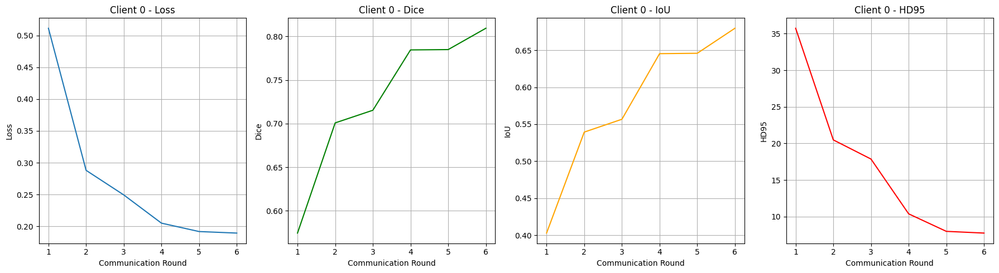

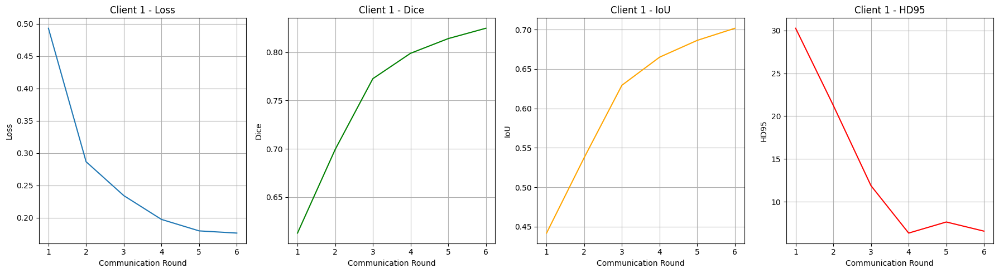

In [22]:
#local clients per communication round

for client_id, metrics in client_history.items():

    rounds = range(1, len(metrics["dice"]) + 1)

    plt.figure(figsize=(18, 5))

    # ----------------------------
    # Loss
    # ----------------------------
    plt.subplot(1, 4, 1)
    plt.plot(rounds, metrics["loss"])
    plt.xlabel("Communication Round")
    plt.ylabel("Loss")
    plt.title(f"Client {client_id} - Loss")
    plt.grid(True)

    # ----------------------------
    # Dice
    # ----------------------------
    plt.subplot(1, 4, 2)
    plt.plot(rounds, metrics["dice"], color="green")
    plt.xlabel("Communication Round")
    plt.ylabel("Dice")
    plt.title(f"Client {client_id} - Dice")
    plt.grid(True)

    # ----------------------------
    # IoU
    # ----------------------------
    plt.subplot(1, 4, 3)
    plt.plot(rounds, metrics["iou"], color="orange")
    plt.xlabel("Communication Round")
    plt.ylabel("IoU")
    plt.title(f"Client {client_id} - IoU")
    plt.grid(True)

    # ----------------------------
    # HD95
    # ----------------------------
    plt.subplot(1, 4, 4)
    plt.plot(rounds, metrics["hd95"], color="red")
    plt.xlabel("Communication Round")
    plt.ylabel("HD95")
    plt.title(f"Client {client_id} - HD95")
    plt.grid(True)

    plt.tight_layout()
    plt.show()

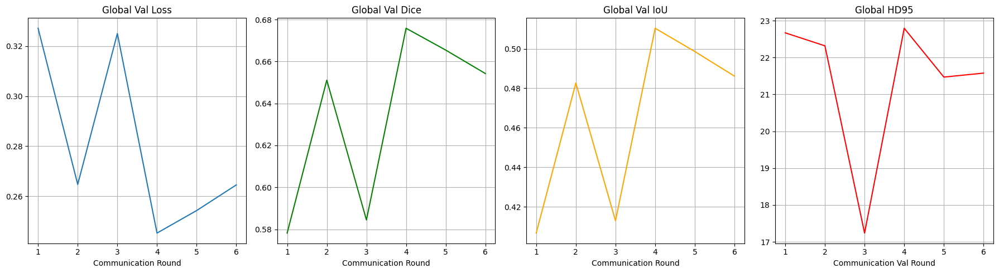

In [23]:
# Global Model per Communication Round
rounds = range(1, len(global_history["dice"]) + 1)

plt.figure(figsize=(18, 5))

plt.subplot(1,4,1)
plt.plot(rounds, global_history["loss"])
plt.xlabel("Communication Round")
plt.title("Global Val Loss")
plt.grid(True)

plt.subplot(1,4,2)
plt.plot(rounds, global_history["dice"], color="green")
plt.xlabel("Communication Round")
plt.title("Global Val Dice")
plt.grid(True)

plt.subplot(1,4,3)
plt.plot(rounds, global_history["iou"], color="orange")
plt.xlabel("Communication Round")
plt.title("Global Val IoU")
plt.grid(True)

plt.subplot(1,4,4)
plt.plot(rounds, global_history["hd95"], color="red")
plt.xlabel("Communication Val Round")
plt.title("Global HD95")
plt.grid(True)

plt.tight_layout()
plt.show()

**Test Set and Segmentation**

In [24]:
# -----------------------------
# 1️⃣ Load test set
# -----------------------------
test_dwi, test_masks = load_dwi_mask_pairs(os.path.join(data_dir, "test"))

test_dataset = ISLESDataset(
    dwi_files=test_dwi,
    mask_files=test_masks,
    transform=transform,
)

test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
print("Test samples:", len(test_dataset))

# -----------------------------
# 2️⃣ Load best global model
# -----------------------------
best_model_ckpt = torch.load("best_global_model.pth")
global_model = create_model().to(device)
global_model.load_state_dict(best_model_ckpt["model_state_dict"])
global_model.eval()

# -----------------------------
# 3️⃣ Metrics setup
# -----------------------------
dice_metric = DiceMetric(include_background=False, reduction="mean")
hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

all_dice = []
all_hd95 = []
all_iou = []


# -----------------------------
# 4️⃣ Evaluate on test set
# -----------------------------
global_model.eval()
all_dice = []
all_hd95 = []
all_iou = []

with torch.no_grad():
    test_bar = tqdm(test_loader, desc="Testing", leave=True)
    for batch_idx, batch in enumerate(test_bar):
        images = batch["image"].to(device, dtype=torch.float32)
        masks = batch["mask"].to(device, dtype=torch.float32)

        outputs = global_model(images)
        pred_binary = (torch.sigmoid(outputs) > 0.5).float()

        # Metrics
        dice_metric(pred_binary, masks)
        hd_metric(pred_binary, masks)

        # Optional: show running metrics in tqdm
        running_dice = dice_metric.aggregate().item()
        running_hd = hd_metric.aggregate().item()
        running_iou = running_dice / (2 - running_dice)
        test_bar.set_postfix({
            "Dice": f"{running_dice:.4f}",
            "IoU": f"{running_iou:.4f}",
            "HD95": f"{running_hd:.4f}"
        })

    # Final metrics
    mean_dice = dice_metric.aggregate().item()
    mean_hd95 = hd_metric.aggregate().item()
    mean_iou = mean_dice / (2 - mean_dice)

    print(f"\nTest Set Metrics:")
    print(f"Dice: {mean_dice:.4f}")
    print(f"IoU: {mean_iou:.4f}")
    print(f"HD95: {mean_hd95:.4f}")

    # Reset metrics for future use
    dice_metric.reset()
    hd_metric.reset()

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test samples: 29
Factorizer(
  (stem): Conv3d(1, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  (encoder): UNetEncoder(
    (blocks): ModuleList(
      (0): UNetEncoderBlock(
        (downsample): Identity()
        (block): FactorizerStage(
          (pos_embed): Identity()
          (blocks): ModuleList(
            (0): FactorizerBlock(
              (norm1): LayerNorm(
                (norm): LayerNorm((32,), eps=1e-05, elementwise_affine=True)
              )
              (fact): FactMixer(
                (in_proj): Linear(
                  (flatten): Flatten(start_dim=2, end_dim=-1)
                  (linear): Conv1d(32, 32, kernel_size=(1,), stride=(1,), bias=False)
                )
                (reshape): SWMatricize(
                  (shifted_windows): ModuleList(
                    (0-1): 2 x Matricize(
                      (rearrange): Rearrange('b (h d) (g0 p0) (g1 p1) (g2 p2) -> (b h) (g0 g1 g2) d (p0 p1 p2)', d=8, p0=2, p1=2, p2=2)

Testing: 100%|██████████| 29/29 [00:17<00:00,  1.70it/s, Dice=0.6030, IoU=0.4317, HD95=27.7165]


Test Set Metrics:
Dice: 0.6030
IoU: 0.4317
HD95: 27.7165


**Visualize**

29


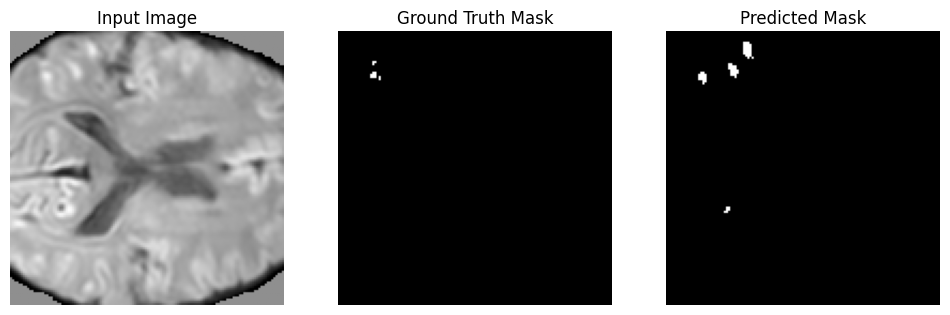

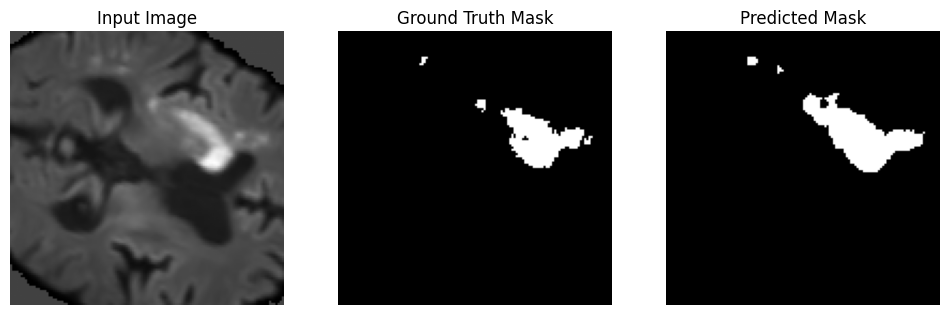

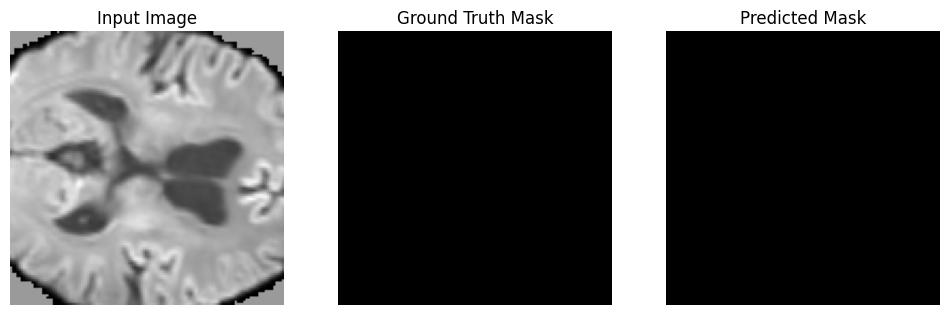

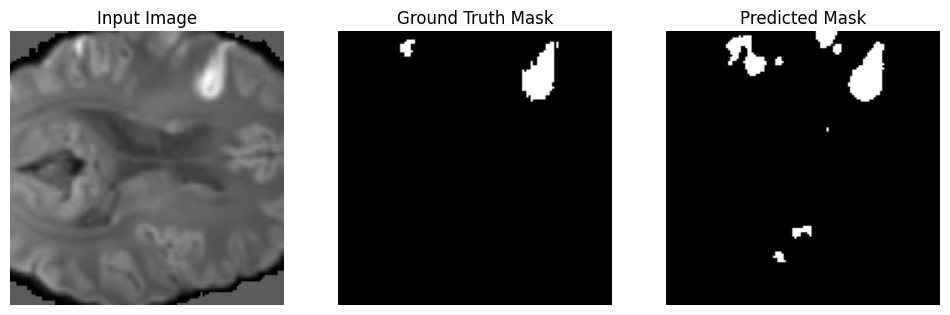

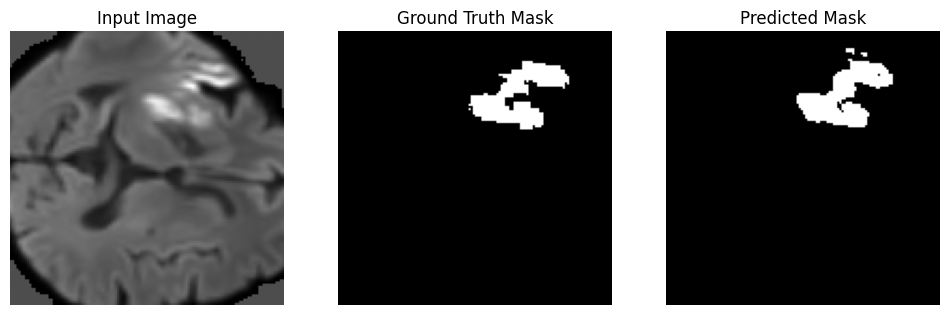

...

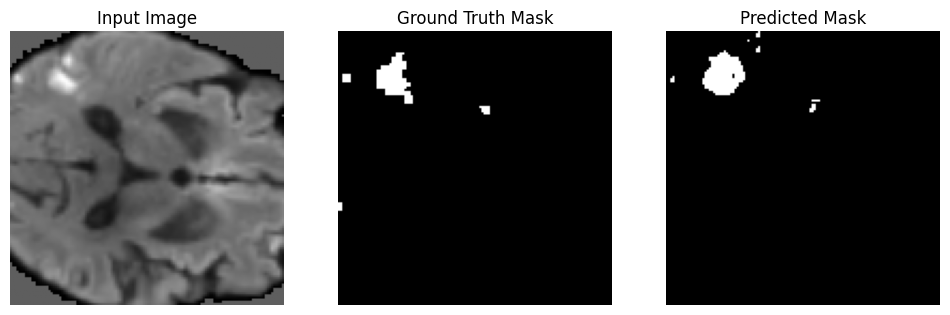

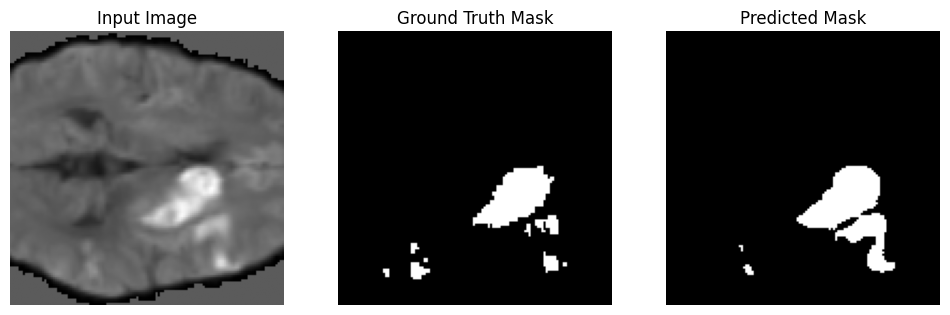

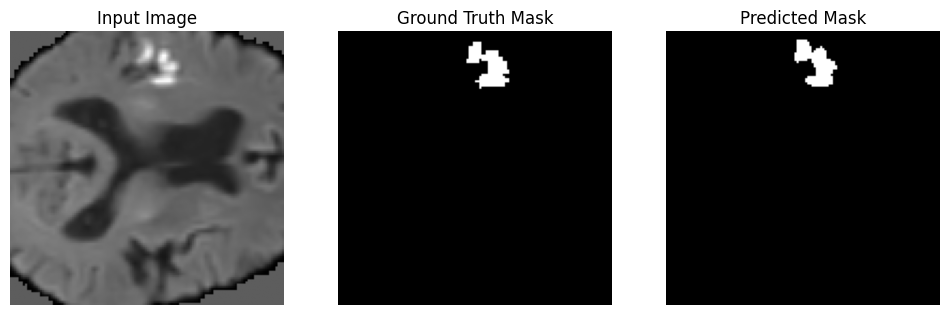

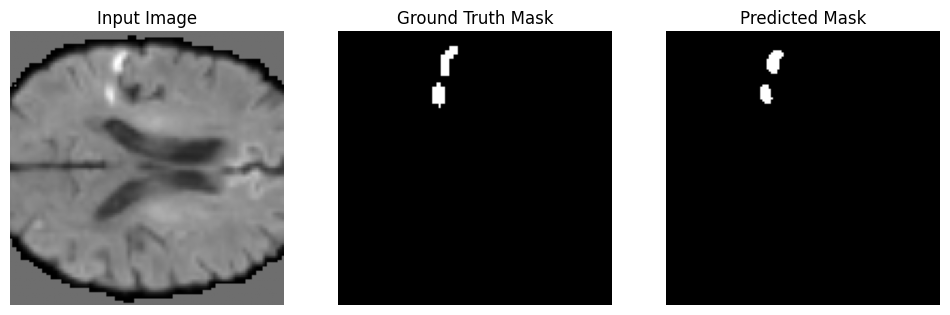

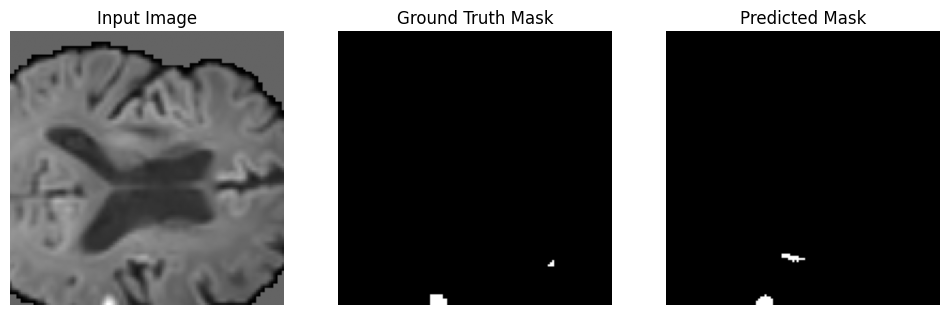

In [25]:
num_visualize = len(test_dataset)
print(num_visualize)

global_model.eval()

for i in range(num_visualize):
    sample = test_dataset[i]

    # Get tensors
    image_tensor = sample["image"].unsqueeze(0).to(device, dtype=torch.float32)
    mask_tensor  = sample["mask"]

    # Convert for visualization
    image = sample["image"][0].cpu().numpy()
    mask  = sample["mask"][0].cpu().numpy()

    # Predict
    with torch.no_grad():
        output = global_model(image_tensor)
        pred = (torch.sigmoid(output)[0, 0].cpu().numpy() > 0.5).astype(float)

    # Middle slice
    mid_slice = image.shape[2] // 2
    img_slice  = image[:, :, mid_slice]
    mask_slice = mask[:, :, mid_slice]
    pred_slice = pred[:, :, mid_slice]

    # Plot
    plt.figure(figsize=(12,4))

    plt.subplot(1,3,1)
    plt.imshow(img_slice, cmap="gray")
    plt.title("Input Image")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(mask_slice, cmap="gray")
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(pred_slice, cmap="gray")
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.show()